surfplot only works in earlier version of matplotlib, thus we need to downgrade the matplotlib to `3.4.3`

In [2]:
from neuromaps.datasets import fetch_fslr
from surfplot import Plot
from brainspace.datasets import load_parcellation
from enigmatoolbox.utils.parcellation import parcel_to_surface

import pandas as pd
import numpy as np
from scipy import stats
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

import seaborn as sns
from nilearn import plotting, datasets, surface
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap, LinearSegmentedColormap

from statsmodels.stats.multitest import multipletests as fdr
%matplotlib inline

more examples https://surfplot.readthedocs.io/en/latest/

In [1]:
#print(matplotlib.__version__)
#!pip uninstall matplotlib
#!pip install matplotlib==3.4.3

## Prepare the data for plotting
### Load them

In [3]:
# set dirs
base_dir = '/Volumes/GoogleDrive/My Drive/Gradient_Shift_Cellular_Basis/Milgram'
figure_dir = base_dir+'/figures/surface_plots'
data_dir = base_dir+'/data'

# the 7 networks
schaefer400_7Networks = pd.read_csv(data_dir+'/schaefer_400_7Net_labels_manually_added.csv',header=None,index_col=0)

# Cell Types
LakeDFC_schaefer400 = pd.read_csv(data_dir+'/schaeffer_LAKE_DFC_400_7Net_expr_mat_new_NormZscore0.3.csv',header=None,index_col=0)
LakeDFC_schaefer400.replace(0,0.0001,inplace=True)
LakeVIS_schaefer400 = pd.read_csv(data_dir+'/schaeffer_LAKE_VIS_400_7Net_expr_mat_new_NormZscore0.3.csv',header=0,index_col=0)
LakeVIS_schaefer400.replace(0,0.0001,inplace=True)
# insert first column as 0 for label 0
LakeDFC_schaefer400.insert(0,'0',np.zeros(len(LakeDFC_schaefer400)).tolist())
LakeVIS_schaefer400.insert(0,'0',np.zeros(len(LakeVIS_schaefer400)).tolist())

### Map parcel to vertex

In [4]:
# Networks
schaefer400_7Networks_fsaverage6 = parcel_to_surface(schaefer400_7Networks[1].to_numpy(), 'schaefer_400_fsa6')

# for cell types
cell_types_DFC = list(LakeDFC_schaefer400.index.values)
cell_types_VIS = list(LakeVIS_schaefer400.index.values)
LakeDFC_fsa6 = {}
LakeVIS_fsa6 = {}
for this_cell in list(range(len(cell_types_DFC))):
    LakeDFC_fsa6[cell_types_DFC[this_cell]] = parcel_to_surface(LakeDFC_schaefer400.loc[cell_types_DFC[this_cell]].to_numpy(), 'schaefer_400_fsa6')
    LakeVIS_fsa6[cell_types_VIS[this_cell]] = parcel_to_surface(LakeVIS_schaefer400.loc[cell_types_VIS[this_cell]].to_numpy(), 'schaefer_400_fsa6')

### Make base plots

In [5]:
# download surfaces:
surfaces = fetch_fslr()
#surfaces = fetch_fslr(density='164k')
# check the available surfaces:
#surfaces.keys()
#---- output ----
# dict_keys(['midthickness', 'inflated', 'veryinflated', 'sphere', 'medial', 'sulc', 'vaavg'])
#---- output ----

# load schaefer parcellation labels (in fsaverage6)
lh_schaefer400, rh_schaefer400 = load_parcellation('schaefer')
# each vertex stores the corresponding parcel label
#lh_parc.shape
#---- output ----
# (32492,)
#---- output ----

# for gradients, vary inflated version can best visualize the details
lh, rh = surfaces['veryinflated']

vertex_per_hemi = int(len(schaefer400_7Networks_fsaverage6)/2)

## Supplement 1 Transmodal/Unimodal-associated cell in both Hemispheres

### 1. Cell type distribution

In [6]:
cell_types_DFC

['DFC_Ex1',
 'DFC_Ex2',
 'DFC_Ex3',
 'DFC_Ex4',
 'DFC_Ex5',
 'DFC_Ex6',
 'DFC_Ex8',
 'DFC_In1',
 'DFC_In3',
 'DFC_In4',
 'DFC_PVALB',
 'DFC_SST',
 'DFC_End',
 'DFC_Per',
 'DFC_Ast',
 'DFC_Oli',
 'DFC_OPC',
 'DFC_Mic']

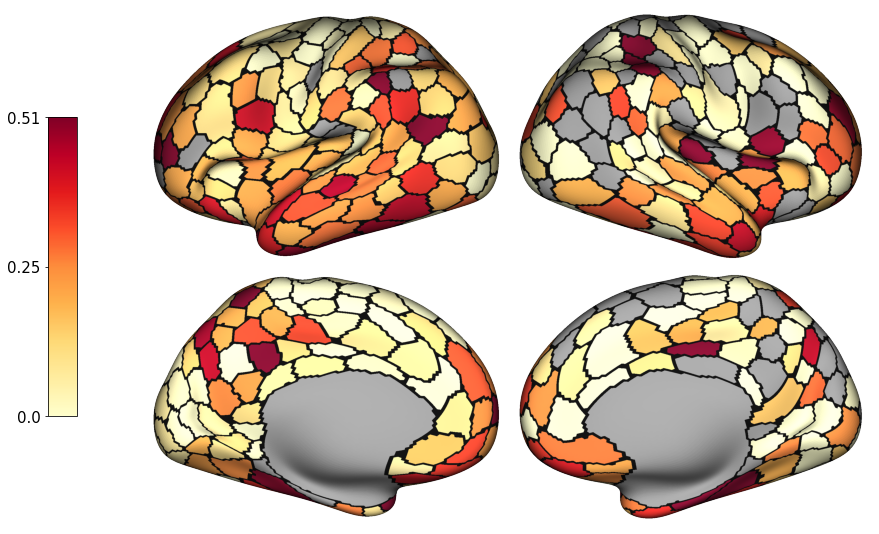

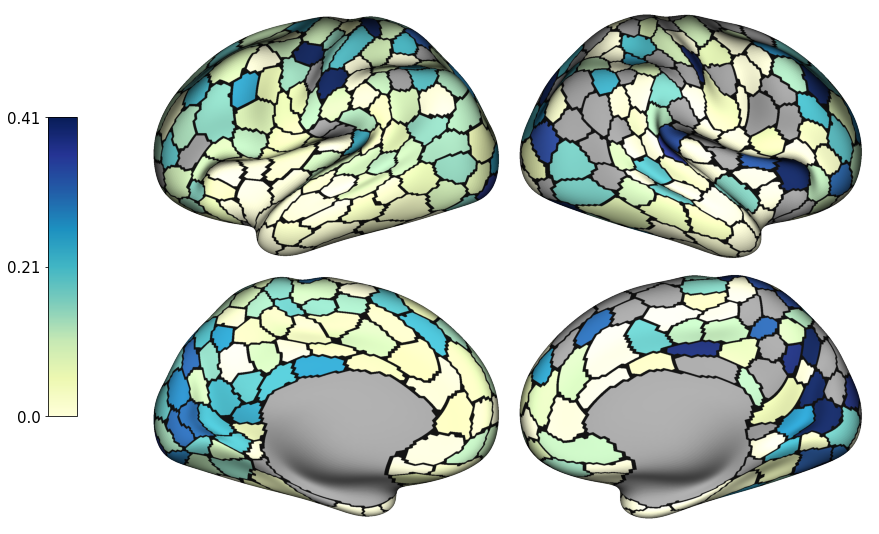

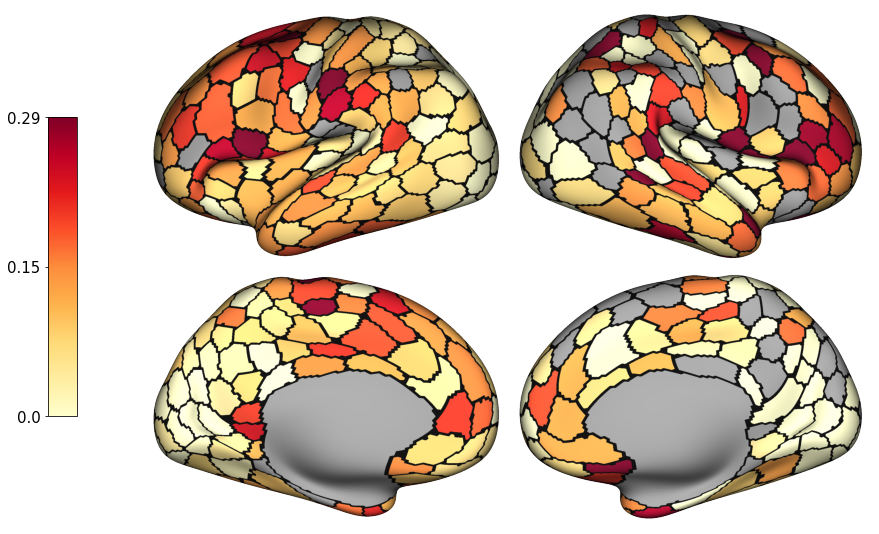

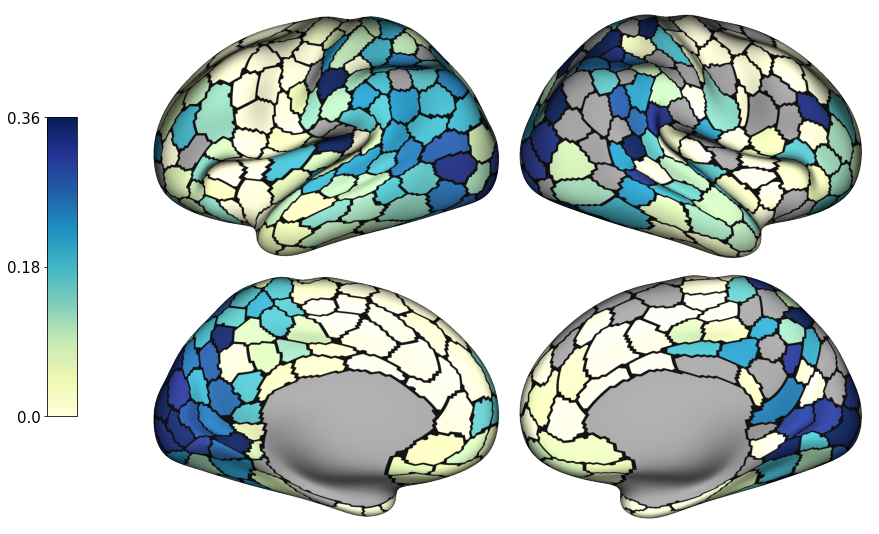

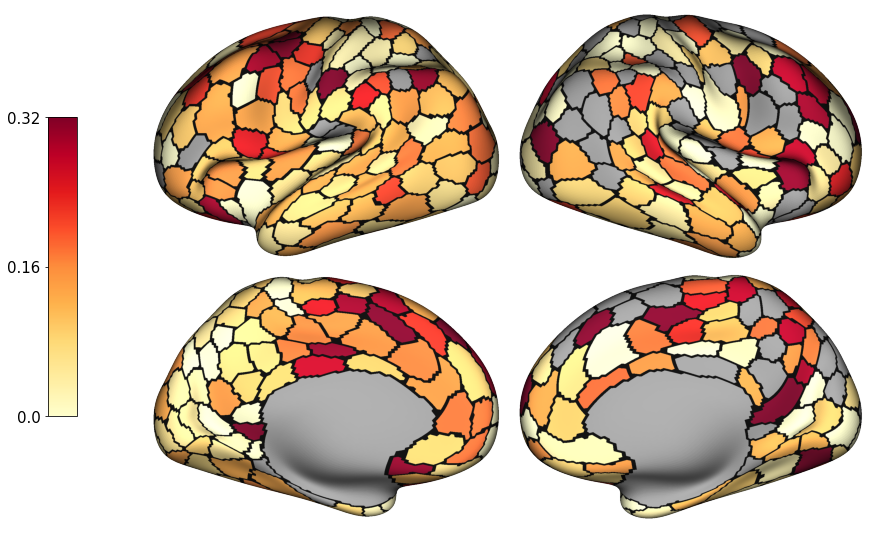

...

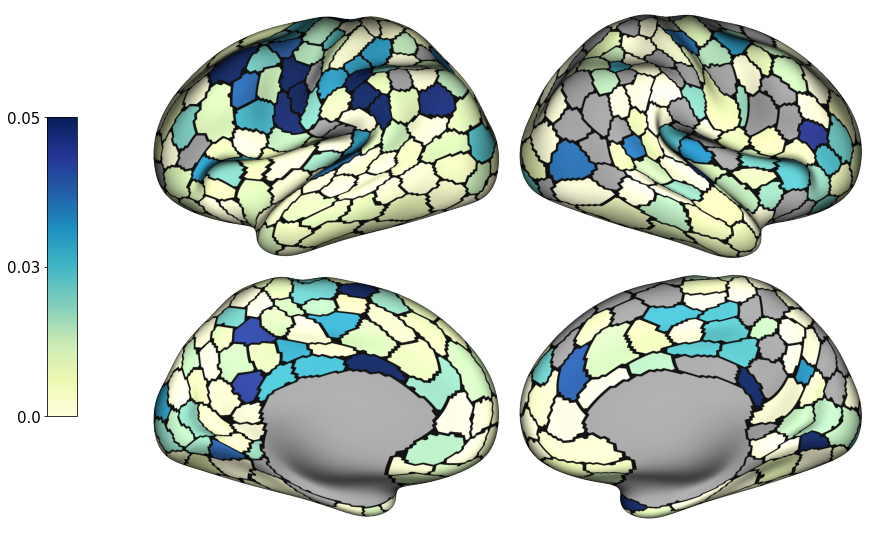

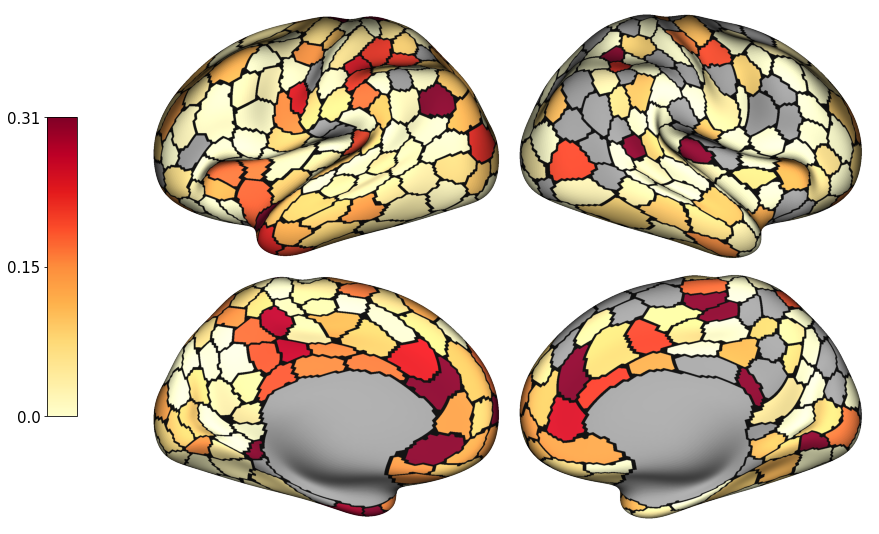

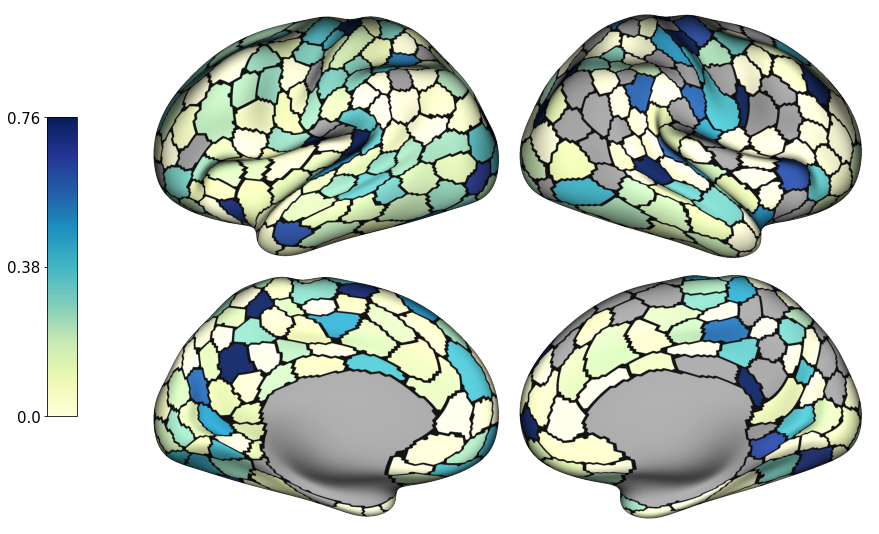

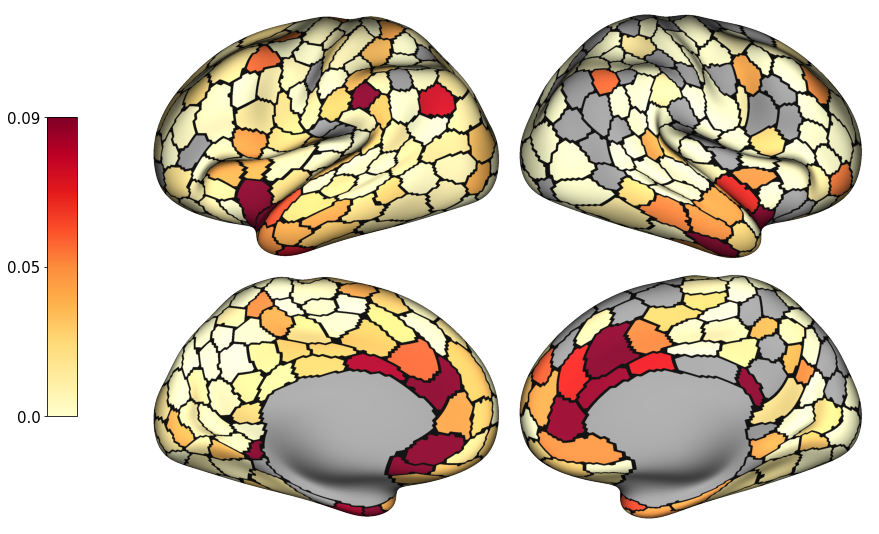

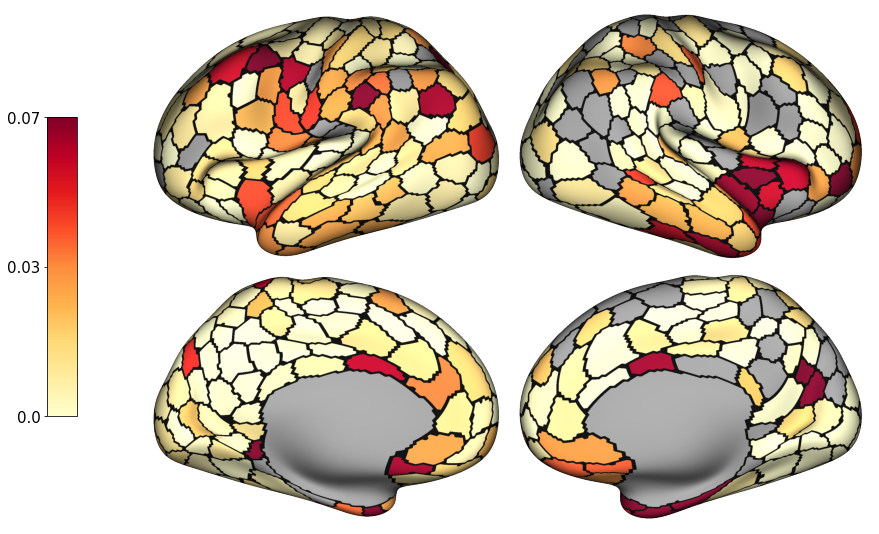

In [12]:
DFC_colors = ['YlOrRd','YlGnBu','YlOrRd','YlGnBu','YlOrRd','YlGnBu','YlOrRd',
             'YlOrRd', 'YlGnBu','YlGnBu','YlGnBu','YlOrRd','YlGnBu','YlGnBu',
             'YlOrRd', 'YlGnBu','YlOrRd','YlOrRd']
DFC_color_dict = {}
for this_cell in list(range(len(cell_types_DFC))):
    
    DFC_color_dict[cell_types_DFC[this_cell]] = DFC_colors[this_cell]
    this_lh = LakeDFC_fsa6[cell_types_DFC[this_cell]][0:vertex_per_hemi]
    this_rh = LakeDFC_fsa6[cell_types_DFC[this_cell]][vertex_per_hemi:]
    
    # set up the surface plot base
    p = Plot(lh, rh,size=(1400, 1000), zoom=1.7)

    # make layer for the cell type distribution
    p.add_layer({'left': this_lh, 'right': this_rh}, cmap=DFC_colors[this_cell], color_range = (0,np.nanpercentile(LakeDFC_fsa6[cell_types_DFC[this_cell]],97))) #cbar_label='Default mode'

    # add layer for the schaefer 400 pacels outline
    p.add_layer({'left': lh_schaefer400, 'right': rh_schaefer400}, cmap='gray', as_outline=True, cbar=False)
    
    # set label properties
    kws = {'location': 'left',  'decimals': 2, 'shrink': .5,
           'fontsize': 15, 'n_ticks': 3, 'aspect': 10,
           'draw_border': True} #'label_direction': 45,'shrink': .15,

    fig = p.build(cbar_kws=kws)
    fig.patch.set_alpha(0.0)
    plt.savefig(figure_dir+f'/{cell_types_DFC[this_cell]}_Schaefer400.pdf', transparent=True)

In [8]:
cell_types_VIS

['VIS_Ex1',
 'VIS_Ex3',
 'VIS_Ex4',
 'VIS_Ex5',
 'VIS_Ex6',
 'VIS_Ex8',
 'VIS_In1',
 'VIS_In2',
 'VIS_In3',
 'VIS_In4',
 'VIS_PVALB',
 'VIS_SST',
 'VIS_End',
 'VIS_Per',
 'VIS_Ast',
 'VIS_Oli',
 'VIS_OPC',
 'VIS_Mic']

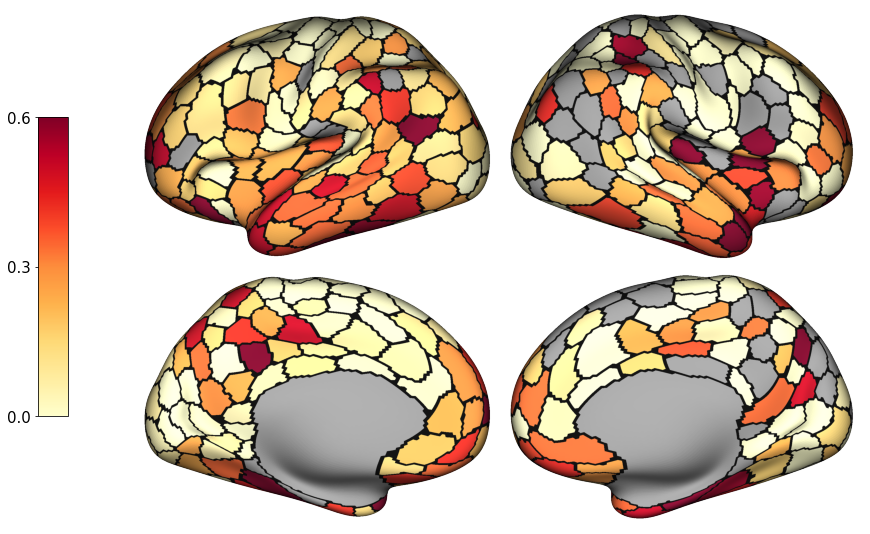

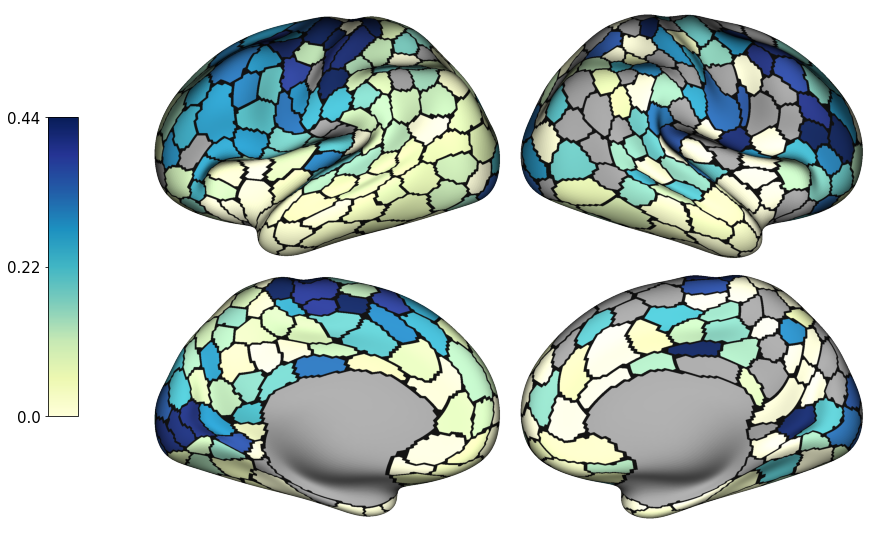

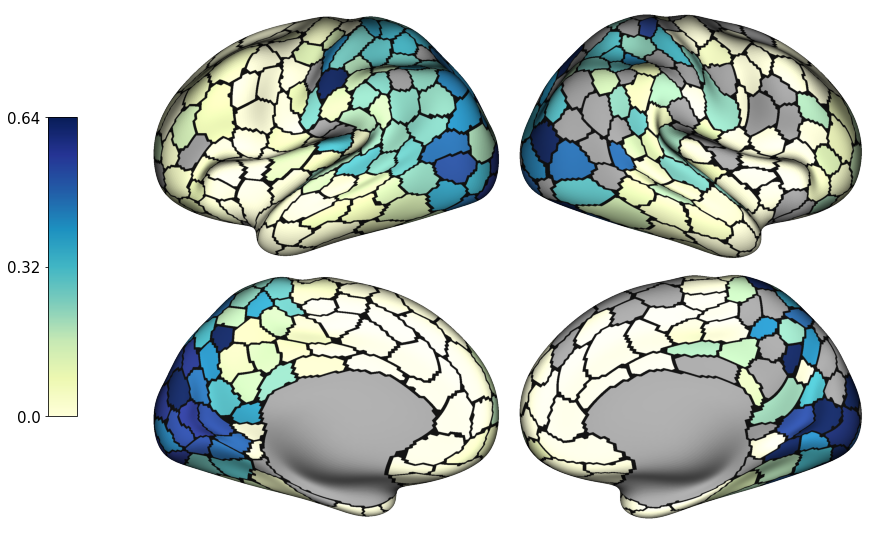

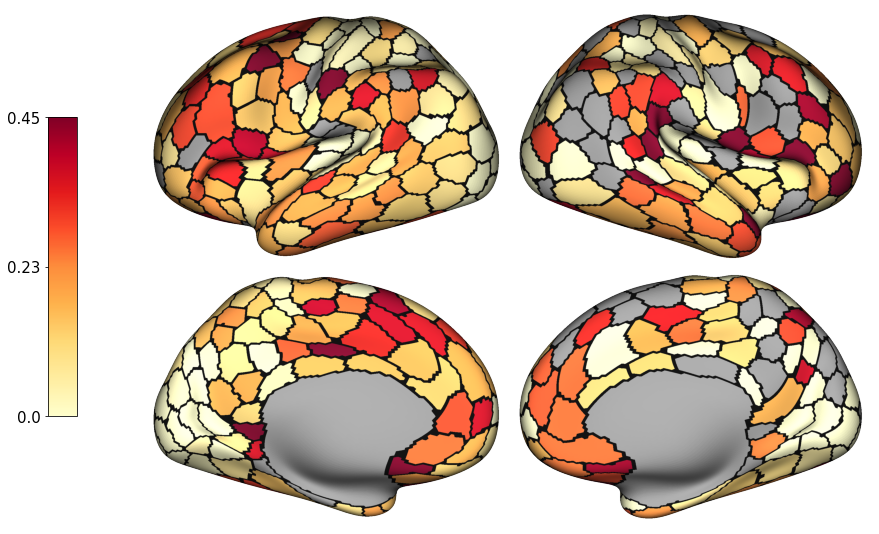

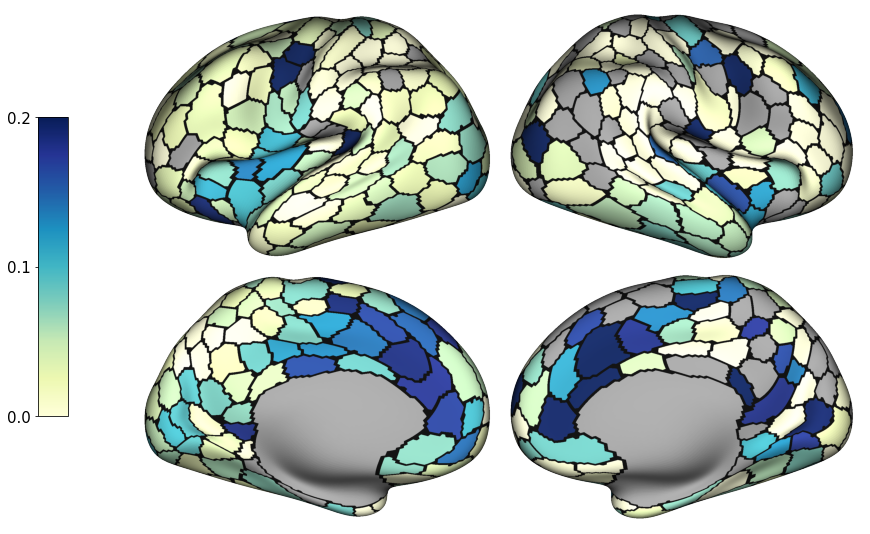

...

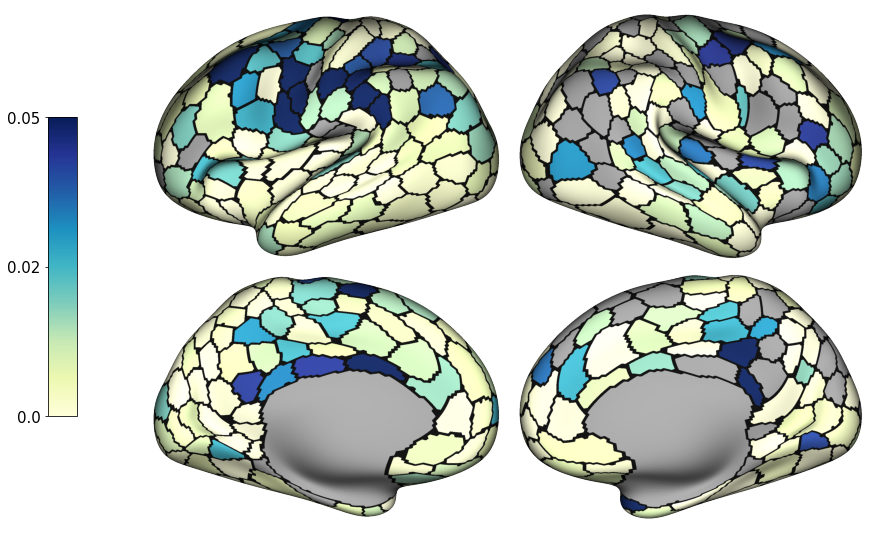

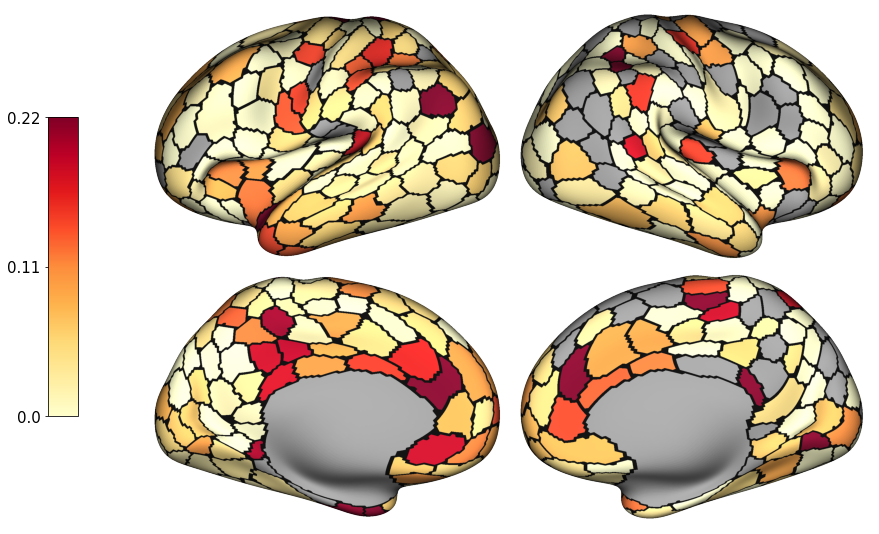

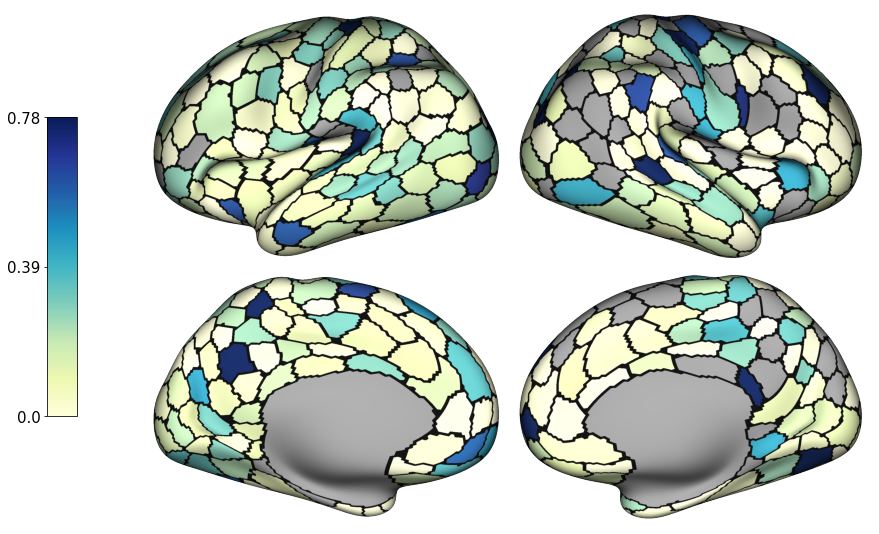

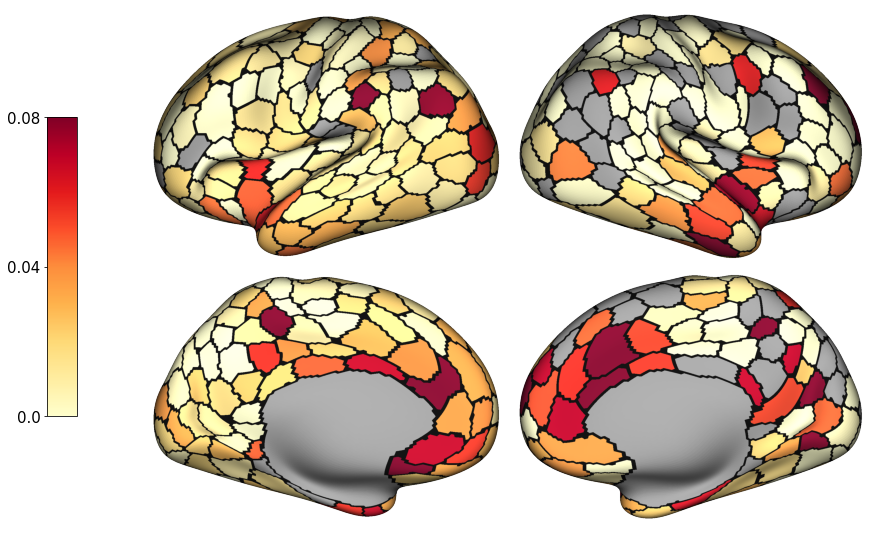

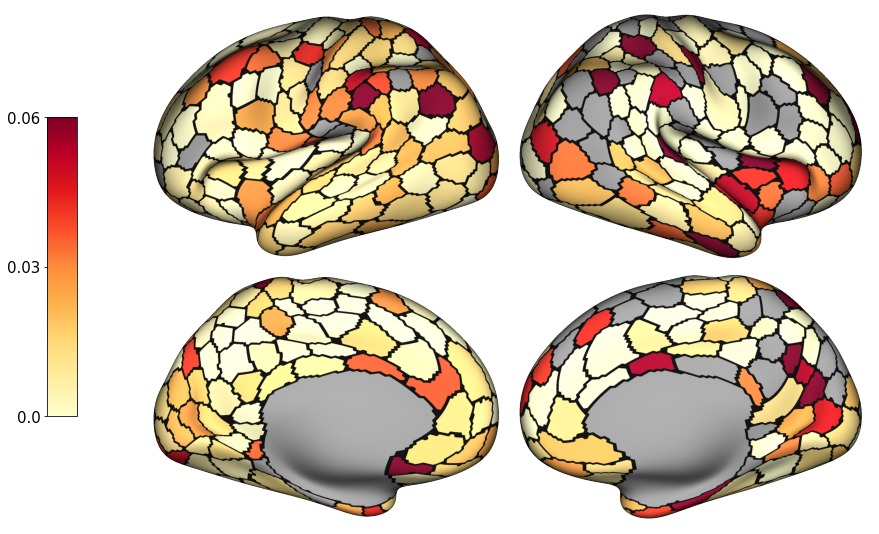

In [11]:
VIS_colors = ['YlOrRd','YlGnBu','YlGnBu','YlOrRd','YlGnBu','YlOrRd',
             'YlOrRd','YlGnBu','YlGnBu','YlGnBu','YlGnBu','YlOrRd',
              'YlGnBu','YlGnBu','YlOrRd','YlGnBu','YlOrRd','YlOrRd']

VIS_color_dict = {}
for this_cell in list(range(len(cell_types_VIS))):
    
    VIS_color_dict[cell_types_DFC[this_cell]] = VIS_colors[this_cell]
    this_lh = LakeVIS_fsa6[cell_types_VIS[this_cell]][0:vertex_per_hemi]
    this_rh = LakeVIS_fsa6[cell_types_VIS[this_cell]][vertex_per_hemi:]
    
    # set up the surface plot base
    p = Plot(lh, rh,size=(1400, 1000), zoom=1.7)

    # make layer for the cell type distribution
    p.add_layer({'left': this_lh, 'right': this_rh}, cmap=VIS_colors[this_cell], color_range = (0,np.nanpercentile(LakeVIS_fsa6[cell_types_VIS[this_cell]],97))) #cbar_label='Default mode'

    # add layer for the schaefer 400 pacels outline
    p.add_layer({'left': lh_schaefer400, 'right': rh_schaefer400}, cmap='gray', as_outline=True, cbar=False)

    # set label properties
    kws = {'location': 'left',  'decimals': 2, 'shrink': .5,
           'fontsize': 15, 'n_ticks': 3, 'aspect': 10,
           'draw_border': True} #'label_direction': 45,'shrink': .15,
    
    fig = p.build(cbar_kws=kws)
    fig.patch.set_alpha(0.0) # set background to transperant
    plt.savefig(figure_dir+f'/{cell_types_VIS[this_cell]}_Schaefer400.pdf', transparent=True) # set background to transperant